<a href="https://colab.research.google.com/github/vanssea/PCVK-_Ganjil-2025/blob/main/Week9.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import cv2 as cv
import numpy as np
import pytesseract
import matplotlib.pyplot as plt
import pandas as pd
from PIL import Image

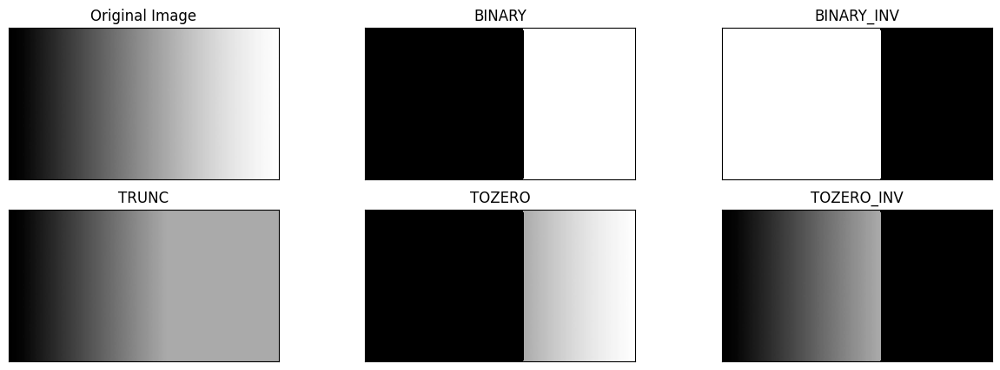

In [ ]:
filename = ('/content/drive/MyDrive/PCVK/gradient.jpg')
img = cv.imread(filename)
thresh1 = cv2.imread(filename)
thresh2 = cv2.imread(filename)
thresh3 = cv2.imread(filename)
thresh4 = cv2.imread(filename)
thresh5 = cv2.imread(filename)
thresh = 170 #nilai Threshold yang ditentukan
#1. thresh1 jika pixel di img>127, maka thresh1 bernilai 1(putih) selain itu bernilai 0(hitam)
thresh1[img>thresh] = 255 #tanpa library
thresh1[img<=thresh] = 0
#2. thresh2 adalah binary threshold inverse
thresh2 = 255 - thresh1 #tanpa library
#3. Threshold Truncate
thresh3[img>thresh] = thresh #tanpa library
#4. Threshold Tozero
thresh4[img<=thresh] = 0 #tanpa library
#5. Threshold Tozero Inverse
thresh5[img>thresh] = 0 #tanpa library
titles = ['Original Image','BINARY','BINARY_INV','TRUNC', 'TOZERO', 'TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]
plt.figure(figsize = (15,5))
for i in range(len(images)):
  plt.subplot(2,3,i+1),plt.imshow(images[i],'gray', interpolation='nearest')
  plt.title(titles[i])
  plt.xticks([]),plt.yticks([])
plt.show()

167


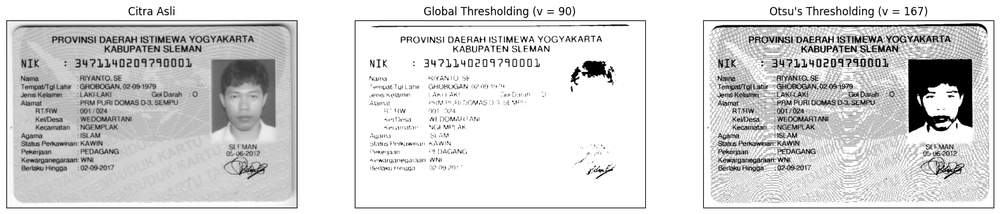

In [ ]:
filename = ('/content/drive/MyDrive/PCVK/ktp.png')
img = cv2.imread(filename,0)
blur = cv2.GaussianBlur(img,(5,5),0)
def otsu(gray):
    pixel_number = gray.shape[0] * gray.shape[1]
    mean_weight = 1.0/pixel_number
    his, bins = np.histogram(gray, np.arange(0,257))
    final_thresh = -1
    final_value = -1
    intensity_arr = np.arange(256)
    for t in bins[1:-1]: # This goes from 1 to 254 uint8 range (Pretty sure wont be those values)
        pcb = np.sum(his[:t])
        pcf = np.sum(his[t:])
        Wb = pcb * mean_weight
        Wf = pcf * mean_weight
        mub = np.sum(intensity_arr[:t]*his[:t]) / float(pcb)
        muf = np.sum(intensity_arr[t:]*his[t:]) / float(pcf)
        #print mub, muf
        value = Wb * Wf * (mub - muf) ** 2
        if value > final_value:
            final_thresh = t
            final_value = value
    final_img = gray.copy()
    print(final_thresh)
    final_img[gray > final_thresh] = 255
    final_img[gray < final_thresh] = 0
    return final_img, final_thresh
otsu_biner, otsu_thresh = otsu(img)
x = ("Otsu's Thresholding (v = ")+str(otsu_thresh)+")"
ret,th1 = cv2.threshold(blur,90,255,cv2.THRESH_BINARY)
#ret,th2 = cv.threshold(blur,thresh,255,cv.THRESH_BINARY)
titles = ['Citra Asli','Global Thresholding (v = 90)', x]
citra3 = [blur, th1, otsu_biner]
plt.figure(figsize = (20,15))
for i in range(len(citra3)):
    plt.subplot(1,3,i+1),plt.imshow(citra3[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

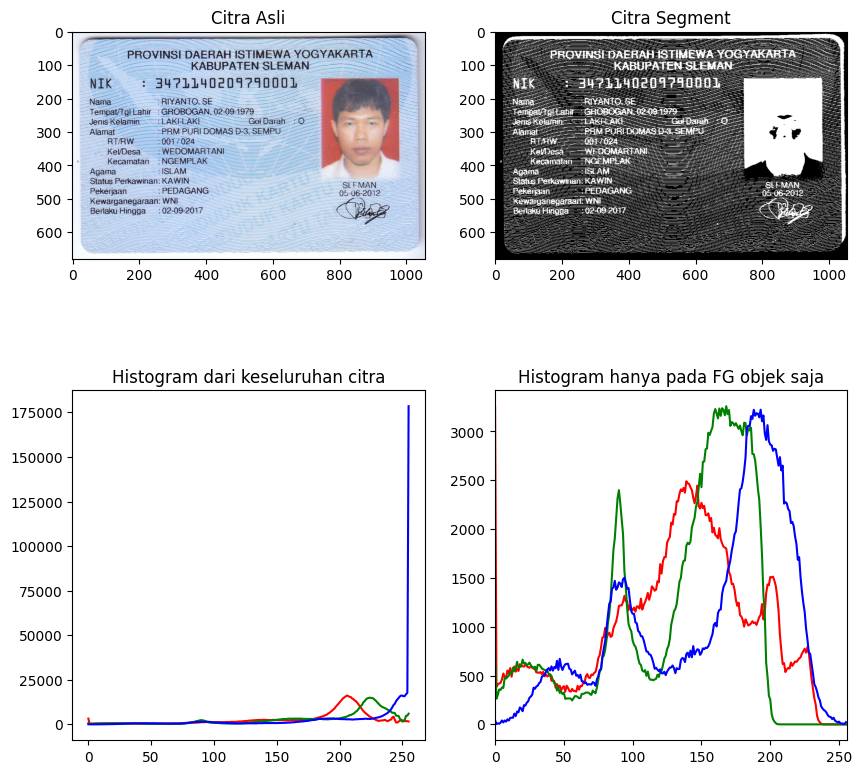

In [ ]:
filename = ('/content/drive/MyDrive/PCVK/ktp.png')
img = cv2.imread(filename)
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

ret3,mask = cv2.threshold(img_gray,200,255,cv2.THRESH_BINARY_INV)

plt.figure(figsize = (10,10))
plt.subplot(2,2,1),plt.imshow(img)
plt.title('Citra Asli')
plt.subplot(2,2,2),plt.imshow(mask,'gray')
plt.title('Citra Segment')
color = ('r','g','b')
for i,col in enumerate(color):
    hist0 = cv2.calcHist([img],[i],None,[256],[0,256])
    plt.subplot(2,2,3),plt.plot(hist0,color = col)
    plt.title('Histogram dari keseluruhan citra')
    hist1 = cv2.calcHist([img],[i],mask,[256],[0,256])
    plt.subplot(2,2,4),plt.plot(hist1,color = col)
    plt.title('Histogram hanya pada FG objek saja')
    plt.xlim([0,256])
plt.show()

(<Axes: >, <matplotlib.image.AxesImage at 0x79310511d700>)

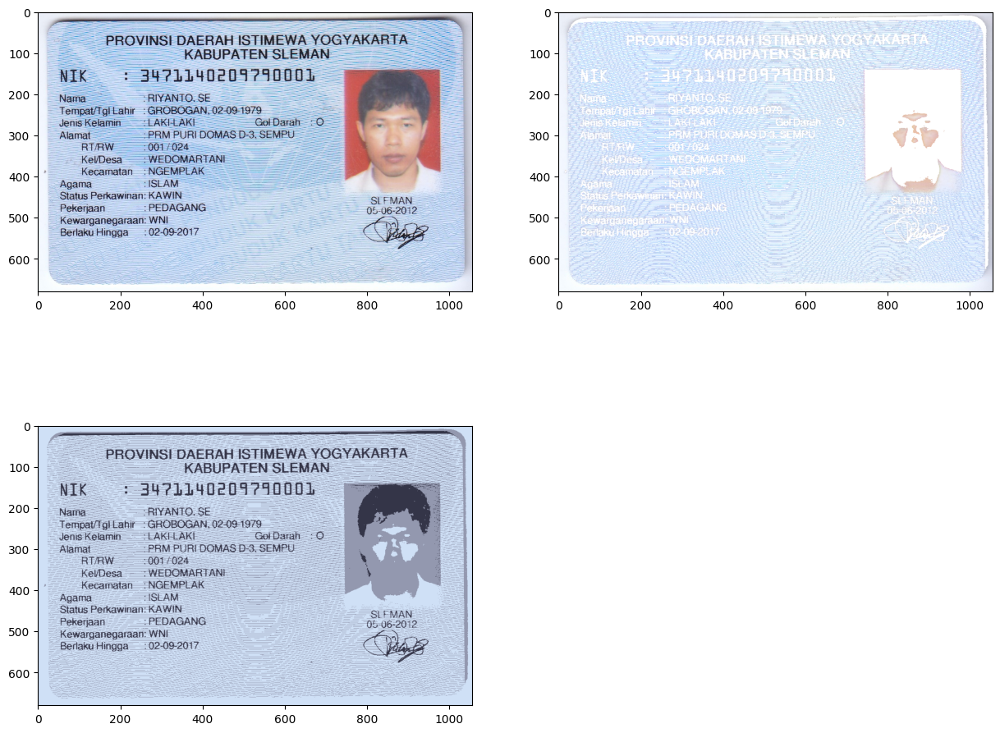

In [ ]:
Filename = ('/content/drive/MyDrive/PCVK/ktp.png')

img = cv.imread(filename)
img = cv.cvtColor(img,cv.COLOR_BGR2RGB)
"""
kita akan menggunakan fungsi cv.kmeans() yang meminta array 2D sebagai masukan,
sedangkan image aslinya adalah array 3D
selanjutnya kita perlu melakukan flattening array image masukan
"""
#reshape array ke bentuk 2D
pixel_values = img.reshape((-1, 3))
# convert to float
pixel_values = np.float32(pixel_values)
"""
syarat berhenti iterasi dr KMeans adalah jika centroid sudah tidak terlalu banyak
pergeseran posisi antara interasi sekarang
dengan iterasi sebelumnya (konvergen). Karena jumlah data yang besar, maka kita
akan hentikan iterasi saat jumlah iterasi = 100
atau epsilon(selisih antara posisi centroid skrg dgn posisi centroid di iterasi
sebelumnya) < 0.2
"""
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 150, 0.1)
"""
jika diperhatikan pada image asli, terdapat 3 warna utama (hijau, biru, dan
putih/orange). untuk percobaan ini kita akan gunakan
3 cluster untuk image ini
"""
k = 3
_, labels, (centers) = cv.kmeans(pixel_values, k, None, criteria, 10,
cv.KMEANS_RANDOM_CENTERS)
#konversi titik centroid kedalam integer
centers = np.uint8(centers)
#flattening label array
labels = labels.flatten()
#konversi warna pixel asli kewarna dari tiap centroidnya
segmented_image = centers[labels.flatten()]
# reshape ke bentuk image asli
segmented_image = segmented_image.reshape(img.shape)
masked_image = np.copy(img)
masked_image0 = masked_image.reshape((-1, 3))
masked_image0[labels != 1] = [255, 255, 255]
masked_image0 = masked_image0.reshape(img.shape)

plt.figure(figsize = (15,12))
plt.subplot(2,2,1),plt.imshow(img)
plt.subplot(2,2,2),plt.imshow(masked_image0)
plt.subplot(2,2,3),plt.imshow(segmented_image)

In [ ]:
!pip install pytesseract
!sudo apt-get install tesseract-ocr-ind

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr-ind is already the newest version (1:4.00~git30-7274cfa-1.1).
0 upgraded, 0 newly installed, 0 to remove and 38 not upgraded.


In [ ]:
def display(img,cmap='gray'):
  fig = plt.figure(figsize=(12,10))
  ax = fig.add_subplot(111)
  ax.imshow(img,cmap='gray')

In [ ]:
from pytesseract import Output
img = cv.imread('/content/drive/MyDrive/PCVK/ktp.png')
d = pytesseract.image_to_data(img, output_type=Output.DICT)
print(d.keys())

dict_keys(['level', 'page_num', 'block_num', 'par_num', 'line_num', 'word_num', 'left', 'top', 'width', 'height', 'conf', 'text'])


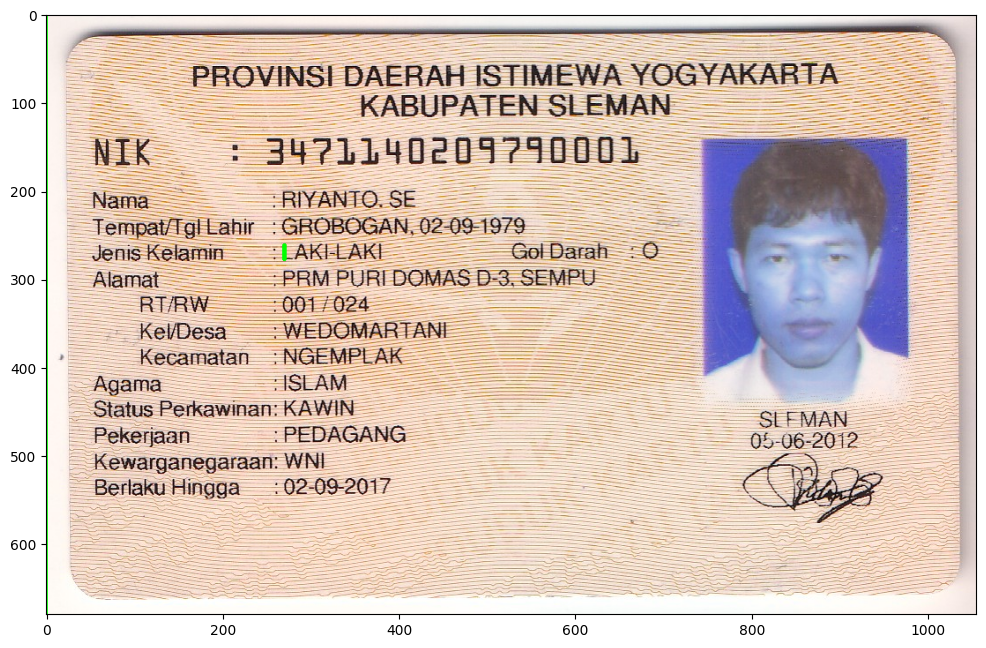

In [ ]:
n_boxes = len(d['text'])
for i in range(n_boxes):
    if int(d['conf'][i]) > 60:
        (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
        img = cv.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
display(img)

em

PROVINSI DAERAH ISTIMEWA YOGYAKARTA
KABUPATEN SLEMAN

 

NIK : 34711140209790001

Nama :RIYANTO. SE

Tempat/Tgl Lahir : GROBOGAN. 02-09-1979

Jenis Kelamin : LAKI-LAKI Gol Darah : 0

Alamat PRM PURI DOMAS D-3. SEMPU
RTRW 1001 1024

Kel/Desa : WEDOMARTANI!
Kecamatan : NGEMPLAK

Agama "ISLAM
Status Bean KAWIN SLEMAN
Pekerjaan : PEDAGANG 05-06-2012

Kewarganegaraan: WNI HI —
Berlaku Hingga :02-09-2017 NIA

   
 

 



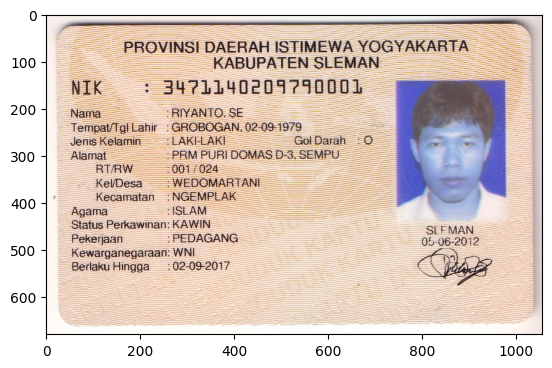

In [ ]:
img = cv.imread("/content/drive/MyDrive/PCVK/ktp.png")
plt.imshow(img)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
th, threshed = cv.threshold(gray, 127, 255, cv.THRESH_TRUNC)
text1 = pytesseract.image_to_data(threshed,output_type='data.frame')
text2 = pytesseract.image_to_string(threshed, lang="ind")
print(text2)
text = text1[text1.conf != -1]
lines = text.groupby('block_num')['text'].apply(list)
conf = text.groupby(['block_num'])['conf'].mean()

Top 5 hasil menurut rata-rata confidence OCR:
TH=80 MODE=BINARY mean_conf=69.29 boxes_used=65


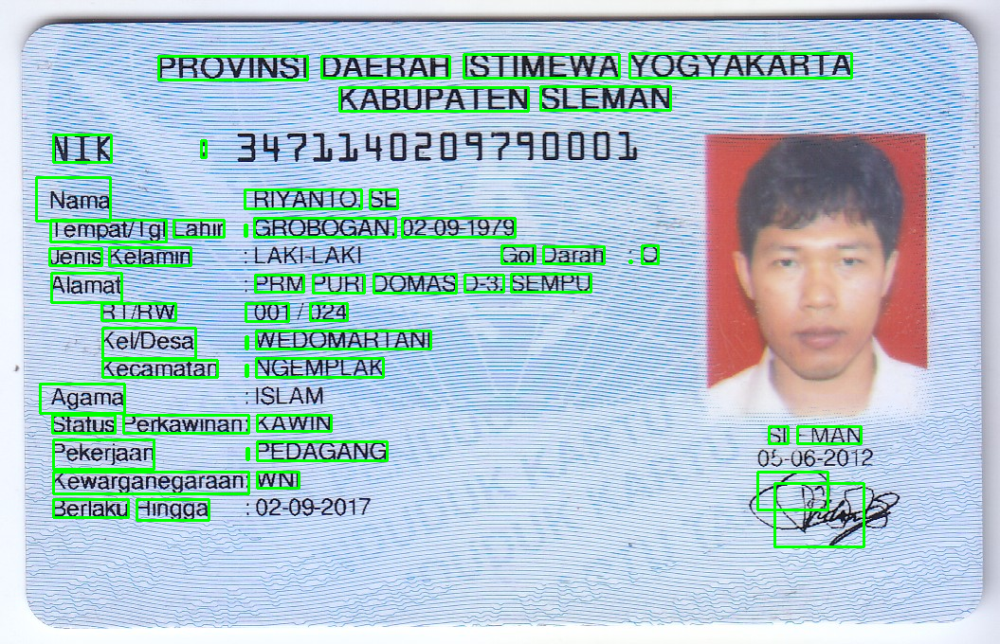

---- extracted text preview (first 600 chars) ----
pbb —“r————.
PROVINSI DAERAH ISTIMEWA YOGYAKARTA
KABUPATEN SLEMAN

NIK : 3471140009719000D1 3 |
Nama :RIYANTO. SE TT
Tempat/Tgl Lahir : GROBOGAN. 02-09-1979
Jenis Kelamin » LAKI-LAKI Got Darah : 0
Alamat PRM PURI DOMAS D-3. SEMPU

RTRW 1001 024

KelDesa : WEDOMARTANI

Kecamatan : NGEMPLAK
Agama : ISLAM
Status Perkawinan: KAWIN SL MAN
Pekerjaan : PEDAGANG 9106.2012
Kewarganegaraan: WNI SA
Berlaku Hingga 02-09-2017 k P3


TH=90 MODE=BINARY mean_conf=67.31 boxes_used=65


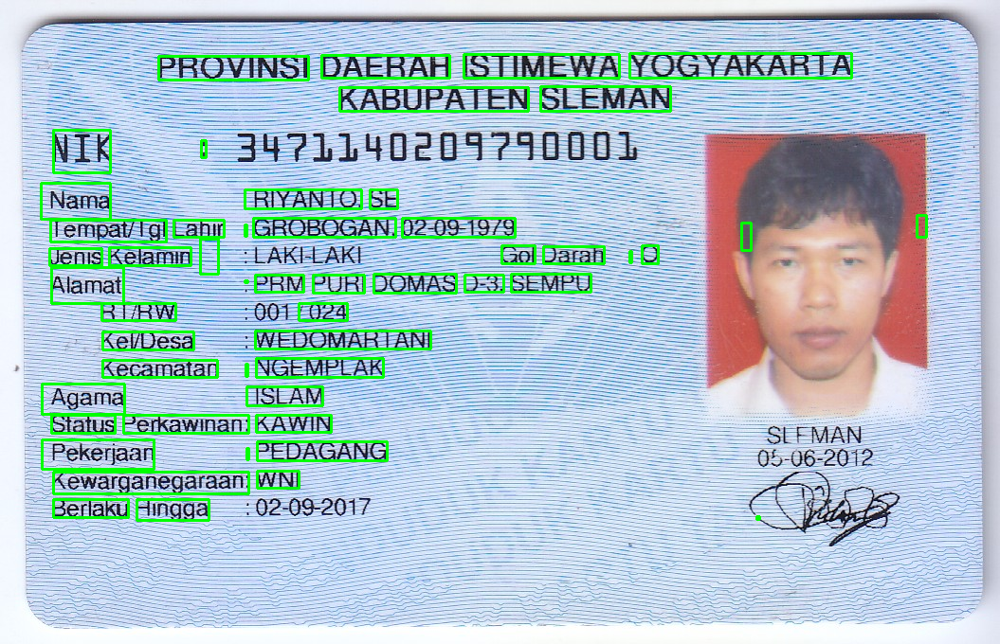

---- extracted text preview (first 600 chars) ----
bb...
PROVINSI DAERAH ISTIMEWA YOGYAKARTA
KABUPATEN SLEMAN

NIK : 34711400097190001 Ta
Nama :RIYANTO. SE ' 3
Tempat/Tgi Lahir : GROBOGAN. 02-09-1979 j 5
Jenis Kelamin — LAKI-LAKI Gol Darah : 0
Alamat : PRM PURI DOMAS D-3. SEMPU

RTRW 1001 /024

KelDesa — : WEDOMARTANI

Kecamatan : NGEMPLAK
Agama “ISLAM
Status Perkawinan: KAWIN
Pekerjaan : PEDAGANG AN,
Kewarganegaraan: WNI A
Berlaku Hingga 02-09-2017 | 3


TH=100 MODE=BINARY mean_conf=66.32 boxes_used=66


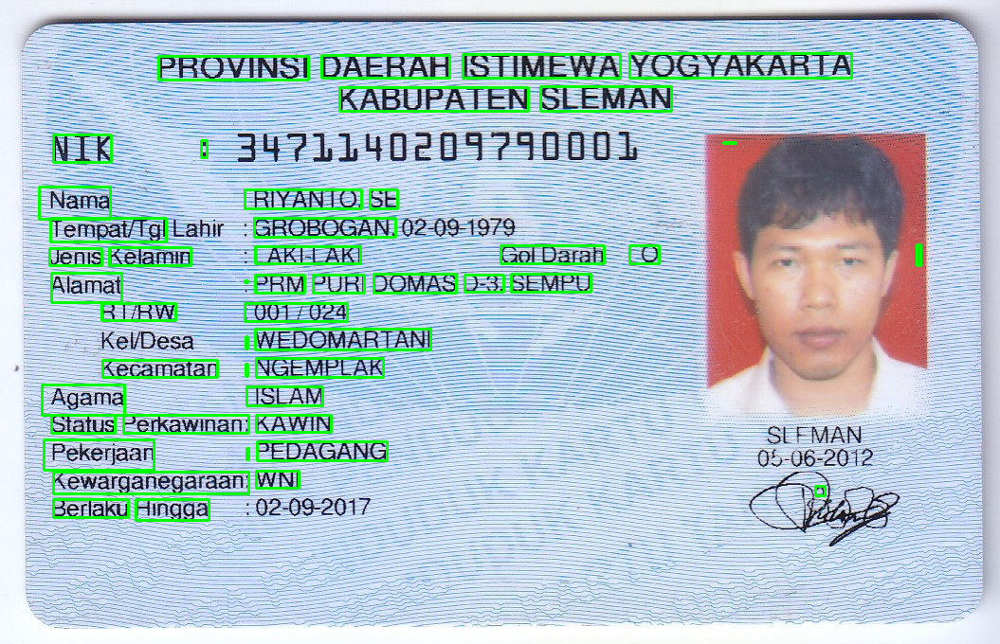

---- extracted text preview (first 600 chars) ----
bb HW —  ————.——..
PROVINSI DAERAH ISTIMEWA YOGYAKARTA
KABUPATEN SLEMAN

NIK : 314711102047190001 5 2

Nama :RIYANTO. SE £

Tempat/Tgi Lahir: GROBOGAN, 02-99-1979 5

Jenis Kelaran 2 LAKI-LAKI GolDarah :0 :

Alamat : PRM PURI DOMAS D-3. SEMPU :
RTRW 10011024 , 5
Kel/Desa : WEDOMARTANI :
Kecamatan : NGEMPLAK

Agama "ISLAM

Status Perkawinan: KAWIN

Pekerjaan : PEDAGANG SAN,

Kewarganegaraan: WNI N

Berlaku Hingga 02-09-2017 s3


TH=110 MODE=BINARY mean_conf=53.42 boxes_used=77


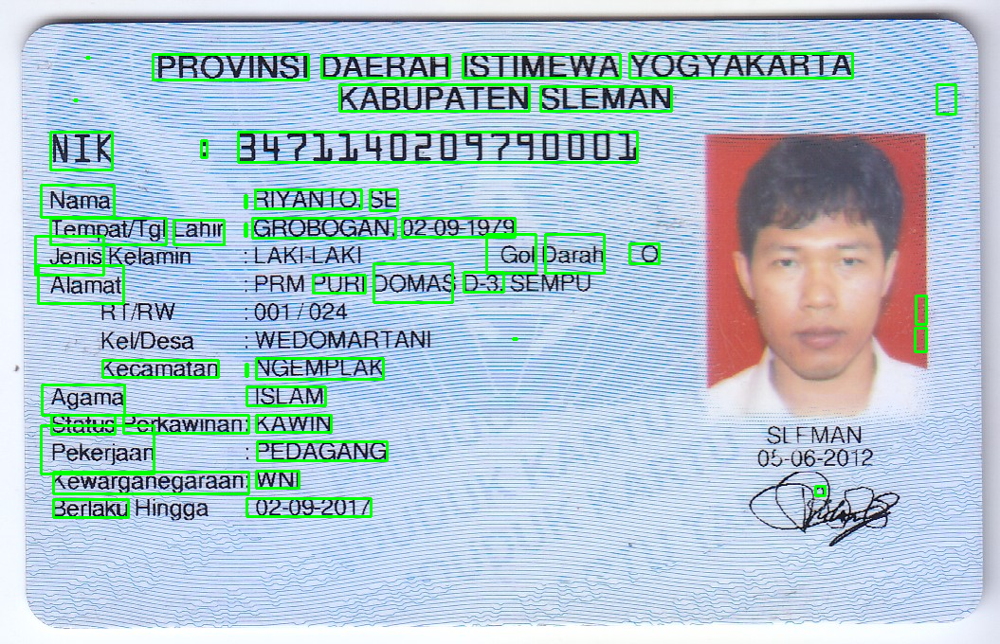

---- extracted text preview (first 600 chars) ----
ra
| PROVINSI DAERAH ISTIMEWA YOGYAKARTA
: KABUPATEN SLEMAN . 5
NIK : 3471140209740001 7 Ti
Nama : RIYANTO. SE . E.
Tempat/Tgi Lahir : GROBOGAN. 02-99-1979 | E
Jenis Kalahwg —: LAKILAKI Gei arah 0 0 :
Alamat —.:PRM PURI DOMAS D3. SEMPU 3
RTRW,“ —on1/Gp4 . 1 -
KelDesa” “TT WEDOMARTANI - | 5
Kecamatan : NGEMPLAK | 8
Agama "ISLAM
Status Perkawinan: KAWIN
Pekerjaan - PEDAGANG SAN,
Kewarganegaraan: WNI N
Berlaku Hingga :02-09-2017 as


TH=100 MODE=BINARY_INV mean_conf=41.82 boxes_used=11


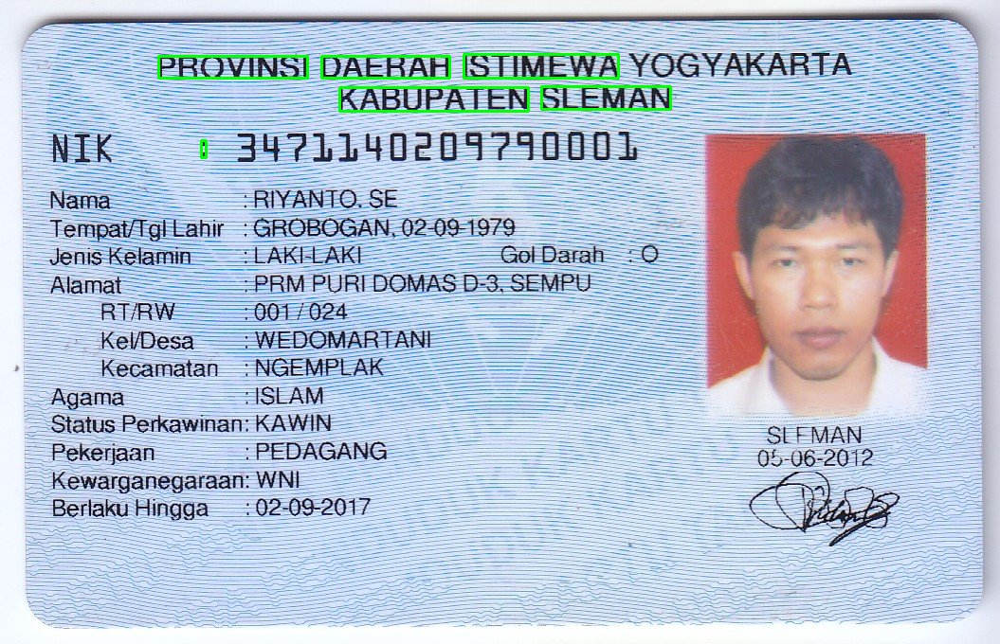

---- extracted text preview (first 600 chars) ----
PROVINSI DALHAH ISTIMEWA YOGYAKARTA
KABUPATEN SLFMAN
NA : 34711100097 90001 na


Semua hasil disimpan di folder: /content/ktp_threshold_results


In [ ]:
# --- Persiapan (jalankan sekali di Colab jika belum terpasang) ---
# !apt-get update
# !apt-get install -y tesseract-ocr libtesseract-dev
# !pip install pytesseract opencv-python-headless matplotlib

import cv2
import pytesseract
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np

# --- Konfigurasi (ubah sesuai lokasi file KTP-mu) ---
IMAGE_PATH = "/content/drive/MyDrive/PCVK/ktp.png"  # ganti path sesuai file
OUT_DIR = Path("ktp_threshold_results")
OUT_DIR.mkdir(parents=True, exist_ok=True)

# OCR config: ubah --psm sesuai kebutuhan (6, 3, 11 sering dicoba)
OCR_CONFIG = r'--oem 3 --psm 6'
LANG = 'ind'  # gunakan 'eng' atau 'ind' bila sudah terinstall tessdata

# --- Baca gambar ---
img_bgr = cv2.imread(IMAGE_PATH)
if img_bgr is None:
    raise FileNotFoundError(f"Image not found: {IMAGE_PATH}")
img_orig = img_bgr.copy()
gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

# --- Parameter coba-coba threshold ---
threshold_values = list(range(80, 181, 10))  # coba 80,90,...,180 (ubah range/step bila perlu)
modes = {
    'BINARY'     : cv2.THRESH_BINARY,
    'BINARY_INV' : cv2.THRESH_BINARY_INV,
    # jika mau tambahkan TRUNC / TOZERO dsb: cv2.THRESH_TRUNC, cv2.THRESH_TOZERO
}

results = []  # untuk menyimpan semua percobaan

for t in threshold_values:
    for mode_name, mode_flag in modes.items():
        # Terapkan global threshold (grayscale)
        _, th = cv2.threshold(gray, t, 255, mode_flag)
        # Bersihkan noise kecil sedikit (opsional) supaya OCR lebih stabil
        kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
        th_clean = cv2.morphologyEx(th, cv2.MORPH_OPEN, kernel, iterations=1)

        # Jalankan pytesseract: dapatkan full string + data per kotak
        try:
            text_str = pytesseract.image_to_string(th_clean, lang=LANG, config=OCR_CONFIG)
        except Exception:
            # fallback tanpa lang jika bahasa tidak tersedia
            text_str = pytesseract.image_to_string(th_clean, config=OCR_CONFIG)

        # Data detail untuk hitung confidence
        from pytesseract import Output
        try:
            d = pytesseract.image_to_data(th_clean, output_type=Output.DICT, config=OCR_CONFIG, lang=LANG)
        except Exception:
            d = pytesseract.image_to_data(th_clean, output_type=Output.DICT, config=OCR_CONFIG)

        # hitung rata-rata confidence hanya pada baris yang bukan -1 dan memiliki teks
        confs = []
        n_boxes = len(d['text'])
        for i in range(n_boxes):
            txt = str(d['text'][i]).strip()
            try:
                c = float(d['conf'][i])
            except:
                c = -1.0
            if txt != "" and c >= 0:
                confs.append(c)
        mean_conf = float(np.mean(confs)) if len(confs) > 0 else -1.0

        # simpan hasil teks ke file per percobaan (supaya bisa diperiksa)
        safe_name = f"th{t}_{mode_name}"
        out_text_file = OUT_DIR / f"{safe_name}.txt"
        out_text_file.write_text(text_str, encoding='utf-8')

        # gambar kotak pada salinan gambar untuk percobaan ini
        img_draw = img_orig.copy()
        box_conf_thr = 40  # ambang confidence untuk gambar kotak; bisa dinaikkan
        for i in range(n_boxes):
            try:
                c = float(d['conf'][i])
            except:
                c = -1.0
            if c >= box_conf_thr and str(d['text'][i]).strip() != "":
                x = int(d['left'][i]); y = int(d['top'][i])
                w = int(d['width'][i]); h = int(d['height'][i])
                cv2.rectangle(img_draw, (x,y), (x+w,y+h), (0,255,0), 2)

        out_img_file = OUT_DIR / f"{safe_name}.png"
        cv2.imwrite(str(out_img_file), img_draw)

        results.append({
            'threshold': t,
            'mode': mode_name,
            'mean_conf': mean_conf,
            'n_conf_boxes': len(confs),
            'text_path': str(out_text_file),
            'img_path': str(out_img_file)
        })

# --- Sort hasil menurut mean_conf (desc) dan tampilkan top 5 ---
results_sorted = sorted(results, key=lambda x: x['mean_conf'], reverse=True)

from IPython.display import display, Image

print("Top 5 hasil menurut rata-rata confidence OCR:")
for r in results_sorted[:5]:
    print(f"TH={r['threshold']} MODE={r['mode']} mean_conf={r['mean_conf']:.2f} boxes_used={r['n_conf_boxes']}")
    display(Image(r['img_path'], width=600))
    print("---- extracted text preview (first 600 chars) ----")
    print(Path(r['text_path']).read_text(encoding='utf-8')[:600])
    print("=================================================\n")

# --- Simpan ringkasan hasil ke CSV agar mudah dianalisis ---
import pandas as pd
df = pd.DataFrame(results_sorted)
df.to_csv(OUT_DIR / "summary_results.csv", index=False)
print("Semua hasil disimpan di folder:", OUT_DIR.resolve())
